In [1]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra
from sentence_transformers import SentenceTransformer
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# LLM Embedding

In [40]:
df = pd.read_csv("../../cleaned_data_v2.csv")


In [41]:
# bedrooms to 3 categories as >4 , <3 and others
df['bedrooms_cat'] = df['bedrooms'].apply(lambda x: '>4' if x>4 else '<3' if x<3 else '3-4')
df['lot_size_category'] = pd.qcut(df['sqft_lot'], q=3, labels=False)
df['grade_living_category'] = pd.qcut(df['grade_living'], q=3, labels=False)

In [151]:
def compile_text(x):
    text =  f"""Bedrooms: {x['bedrooms_cat']}, 
                Lot Size (sqft): {x['lot_size_category']}, 
                Floors: {x['floors']}, 
                View: {x['view']}, 
                Condition: {x['condition']}, 
                Bathroom Category: {x['bathroom_category']}, 
                Near Shore: {x['is_near_shore']}, 
                Grade Living: {x['grade_living_category']}
            """
    return text

In [152]:
sentences = df.apply(lambda x: compile_text(x), axis=1).tolist()

In [153]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.



In [154]:
output = model.encode(sentences=sentences, show_progress_bar= True, normalize_embeddings  = True)

Batches: 100%|██████████| 676/676 [00:19<00:00, 34.62it/s]


In [155]:
df_embedding = pd.DataFrame(output)

In [156]:
df_embedding.to_csv("embedding_train.csv",index = False)


# Clustering

In [157]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


In [158]:
df_embedding = pd.read_csv("embedding_train.csv")

In [159]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding)


out = clf.predict(df_embedding) 
df_embedding["outliers"] = out
df["outliers"] = out

df_embedding_no_out = df_embedding.copy()
df_embedding_with_out = df_embedding.copy()

In [160]:
df_embedding_no_out.shape

(21613, 385)

In [161]:
df_embedding_with_out.shape

(21613, 385)

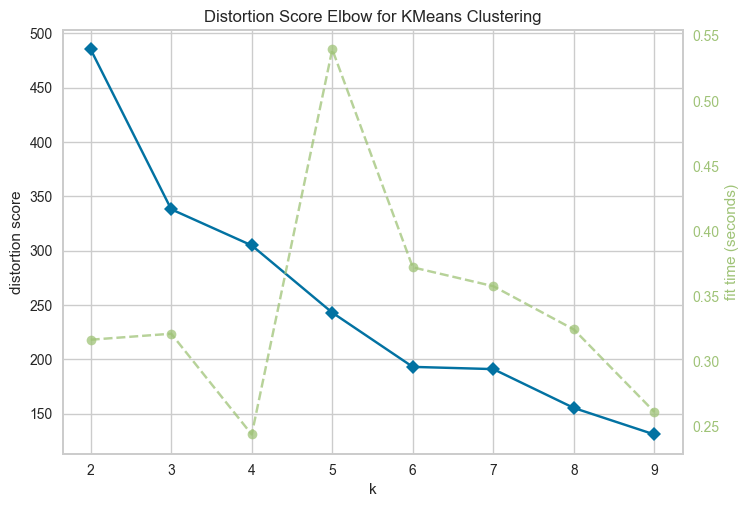

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [162]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=False)
 
visualizer.fit(df_embedding_with_out)        # Fit the data to the visualizer
visualizer.show()       

In [163]:
def make_Silhouette_plot(X, n_clusters):
    plt.xlim([-0.1, 1])
    plt.ylim([0, len(X) + (n_clusters + 1) * 10])
    clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =", n_clusters,
        "The average silhouette_score is :", silhouette_avg,
    )
# Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        plt.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
        plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
        plt.xlabel("The silhouette coefficient values", fontsize=24)
        plt.ylabel("Cluster label", fontsize=24)
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        plt.yticks([])  
        plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
range_n_clusters = list(range(2,10))
for n_clusters in range_n_clusters:
    print(f"N cluster: {n_clusters}")
    make_Silhouette_plot(df_embedding_no_out, n_clusters)   
    plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
    plt.close()

N cluster: 2
For n_clusters = 2 The average silhouette_score is : 0.8212018300644796
N cluster: 3
For n_clusters = 3 The average silhouette_score is : 0.5347658966931773
N cluster: 4
For n_clusters = 4 The average silhouette_score is : 0.516326857706282
N cluster: 5
For n_clusters = 5 The average silhouette_score is : 0.5303362909411657
N cluster: 6
For n_clusters = 6 The average silhouette_score is : 0.45696675709912166
N cluster: 7
For n_clusters = 7 The average silhouette_score is : 0.46405443087589704
N cluster: 8
For n_clusters = 8 The average silhouette_score is : 0.3589840905709371
N cluster: 9
For n_clusters = 9 The average silhouette_score is : 0.36964577484567057


In [203]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
import numpy as np

# Generate sample data
X = df_embedding_with_out.copy()

# Define parameter grid
eps_values = np.linspace(0.1, 2.0, 10)
min_samples_values = range(2, 10)

best_silhouette_score = -1
best_calinski_score = -1
best_params = {}

# Perform grid search
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
        labels = dbscan.fit_predict(X)
        if len(np.unique(labels)) > 1:  # Check if more than one cluster is formed
            silhouette = silhouette_score(X, labels)
            calinski = calinski_harabasz_score(X, labels)
            print(f"Parameters: (eps={eps}, min_samples={min_samples}) - Silhouette Score: {silhouette}, Calinski-Harabasz Score: {calinski}")
            if silhouette > best_silhouette_score:
                best_silhouette_score = silhouette
                best_params['silhouette'] = (eps, min_samples)
            if calinski > best_calinski_score:
                best_calinski_score = calinski
                best_params['calinski'] = (eps, min_samples)

print("\nBest parameters for Silhouette Score:", best_params['silhouette'])
print("Best parameters for Calinski-Harabasz Score:", best_params['calinski'])


Parameters: (eps=0.1, min_samples=2) - Silhouette Score: 0.44950259380914187, Calinski-Harabasz Score: 19938.26007461837
Parameters: (eps=0.1, min_samples=3) - Silhouette Score: 0.4501654386613926, Calinski-Harabasz Score: 21893.589297802922
Parameters: (eps=0.1, min_samples=4) - Silhouette Score: 0.4501540320507644, Calinski-Harabasz Score: 23015.36169893178
Parameters: (eps=0.1, min_samples=5) - Silhouette Score: 0.45012609224692035, Calinski-Harabasz Score: 24268.59064886071
Parameters: (eps=0.1, min_samples=6) - Silhouette Score: 0.45012609224692035, Calinski-Harabasz Score: 24268.59064886071
Parameters: (eps=0.1, min_samples=7) - Silhouette Score: 0.4500582352219114, Calinski-Harabasz Score: 24259.639155149413
Parameters: (eps=0.1, min_samples=8) - Silhouette Score: 0.45017371544456486, Calinski-Harabasz Score: 24212.644245095067
Parameters: (eps=0.1, min_samples=9) - Silhouette Score: 0.45017371544456486, Calinski-Harabasz Score: 24212.644245095067
Parameters: (eps=0.311111111111

KeyboardInterrupt: 

In [207]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define a custom silhouette scoring function
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    return silhouette_score(X, labels)

# Instantiate Gaussian Mixture Model
gmm = GaussianMixture(random_state=42)

# Define parameter grid
param_grid = {
    'n_components': range(2, 11),  # Adjust the range of components as needed
    'covariance_type': ['full', 'tied', 'diag', 'spherical']  # Different covariance types
}

# Perform grid search with parallelization
grid_search = GridSearchCV(estimator=gmm, param_grid=param_grid, scoring=silhouette_scorer, cv=5, n_jobs=-1)
grid_search.fit(X)

# Print the best parameters
print("Best parameters:", grid_search.best_params_)

# Get the best model
best_gmm = grid_search.best_estimator_

# Predict cluster labels using the best model
cluster_labels = best_gmm.predict(X)

# Print the cluster labels
print("Cluster labels:", cluster_labels)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
huggingface/tokenizers: The current process just got forked,

Best parameters: {'covariance_type': 'full', 'n_components': 2}
Cluster labels: [0 0 0 ... 1 0 1]


In [189]:
n_clusters = 3

clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(df_embedding_no_out)
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding_no_out)

338.0442425948695


In [190]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding_no_out,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out,clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out,clusters_predict)}")

Davies bouldin score: 0.6037804697771699
Calinski Score: 69592.4153262019
Silhouette Score: 0.5347658966931773


In [229]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.01)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            137.543        35.73%                     35.73%
1             79.249        20.58%                     56.31%
2             44.667        11.60%                     67.91%


In [192]:
pca_2d_object, df_pca_2d = get_pca_2d(df_embedding_no_out, clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.2)

In [193]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=1, width_line = 0.1)

In [208]:
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=0.1, width_line = 0.1)

In [227]:
import numpy as np
import plotly.express as px
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from umap.umap_ import UMAP  # Import UMAP from umap.umap_

# Generate sample data
X = df_embedding_no_out.copy()

# Apply UMAP for dimensionality reduction
reducer = UMAP(n_components=3, n_neighbors=60,  min_dist=0.1)  # Increased number of neighbors

embedding = reducer.fit_transform(X)

# # Visualize clusters in 3D with Plotly
# fig = px.scatter_3d(x=embedding[:, 0], y=embedding[:, 1], z=embedding[:, 2], color=clusters_predict,
#                     opacity=0.7, labels={'color': 'Cluster'}, title='UMAP 3D Visualization of Clusters')
# fig.show()

fig = px.scatter_3d(df, 
                        x=embedding[:, 0], 
                        y=embedding[:, 1], 
                        z=embedding[:, 2],
                        color=clusters_predict,
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title="UMAP Space").update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": 1,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": 0.1,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
fig.show()

In [167]:
df_no_outliers = df.copy()

In [168]:
df_no_outliers["cluster"] = clusters_predict

In [230]:
# clusters on lat long scatter plot
fig = px.scatter_mapbox(df_no_outliers, 
                        lat="lat", 
                        lon="long", 
                        color="cluster",
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        zoom=10,
                        mapbox_style="carto-positron",
                        title="Clusters on Lat Long",
                        height=800,
                        width=1000)

fig.show()

In [231]:
df_no_outliers["cluster"] = clusters_predict

df_group = df_no_outliers.groupby('cluster').agg(
    {
        'price': 'mean',
        'bedrooms': lambda x: x.value_counts().index[0],
        'bathrooms': lambda x: x.value_counts().index[0],
        'sqft_lot': 'mean',
        'floors': lambda x: x.value_counts().index[0],
        'waterfront': lambda x: x.value_counts().index[0],
        'view': lambda x: x.value_counts().index[0],
        'condition': lambda x: x.value_counts().index[0],
        'yr_built': 'mean',
        'yr_renovated': 'mean',
        'zipcode': lambda x: x.value_counts().index[0],
        'lat': 'mean',
        'long': 'mean',
        'nearest_station_distance_km': 'mean',
        'density': 'mean',
        'commute_time': 'mean',
        'distance_to_point_km': 'mean',
        'is_near_shore': lambda x: x.value_counts().index[0],
        'grade_living': lambda x: x.value_counts().index[0]
    }
).sort_values("price").reset_index()

df_group


,cluster,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,2,326560.836549,3,1.0,12721.763378,1.0,0,0,3,1948.191118,65.191482,98133,47.553015,-122.256051,13098.464446,5353.277394,30.076338,3.160945,False,8400
1,0,550541.050048,3,2.5,15956.051724,2.0,0,0,3,1977.595187,77.514188,98038,47.557776,-122.196503,15716.932735,4704.545917,30.180472,3.351342,False,12320
2,1,730631.216466,2,1.0,11577.390379,1.0,0,0,3,1949.076318,162.029602,98103,47.586582,-122.294722,8470.300722,7094.499075,29.092229,1.120478,True,4320


In [171]:
# print std of price for each cluster
print(df_no_outliers.groupby('cluster')['price'].std().astype(int))
print('without clusters: ',df_no_outliers['price'].std().astype(int))


cluster
0    306642
1    818704
2    164198
Name: price, dtype: int64
without clusters:  367127


In [172]:
# show all rows
pd.set_option('display.max_columns', None)

In [173]:
df_no_outliers.head()

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,outliers,cluster
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260,3-4,0,0,0,0
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990,3-4,1,2,0,0
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620,<3,2,0,0,0
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720,3-4,0,1,0,0
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440,3-4,1,1,0,0


In [232]:
column_outlier_check = 'sqft_lot'

# calculate outliers based on price for IQR and Z-score and save it in a new column
Q1 = df_no_outliers[column_outlier_check].quantile(0.25)
Q3 = df_no_outliers[column_outlier_check].quantile(0.75)
IQR = Q3 - Q1
df_no_outliers['outliers_iqr'] = (df_no_outliers[column_outlier_check] < (Q1 - 1.5 * IQR)) | (df_no_outliers[column_outlier_check] > (Q3 + 1.5 * IQR))

df_no_outliers['outliers_zscore'] = (np.abs(df_no_outliers[column_outlier_check] - df_no_outliers[column_outlier_check].mean()) > (3 * df_no_outliers[column_outlier_check].std()))

# compare the number of outliers based on IQR and Z-score and outliers column
print(df_no_outliers['outliers_iqr'].value_counts())
print(df_no_outliers['outliers_zscore'].value_counts())
print(df_no_outliers['outliers'].value_counts())

# show how many rows overlap between the three columns
print(df_no_outliers[(df_no_outliers['outliers'] == True) & (df_no_outliers['outliers_iqr'] == True) & (df_no_outliers['outliers_zscore'] == True)].shape[0])
print(df_no_outliers[(df_no_outliers['outliers'] == True) & (df_no_outliers['outliers_iqr'] == True)].shape[0])
print(df_no_outliers[(df_no_outliers['outliers'] == True) & (df_no_outliers['outliers_zscore'] == True)].shape[0])
print(df_no_outliers[(df_no_outliers['outliers_iqr'] == True) & (df_no_outliers['outliers_zscore'] == True)].shape[0])


outliers_iqr
False    19188
True      2425
Name: count, dtype: int64
outliers_zscore
False    21266
True       347
Name: count, dtype: int64
outliers
0    19451
1     2162
Name: count, dtype: int64
9
232
9
347


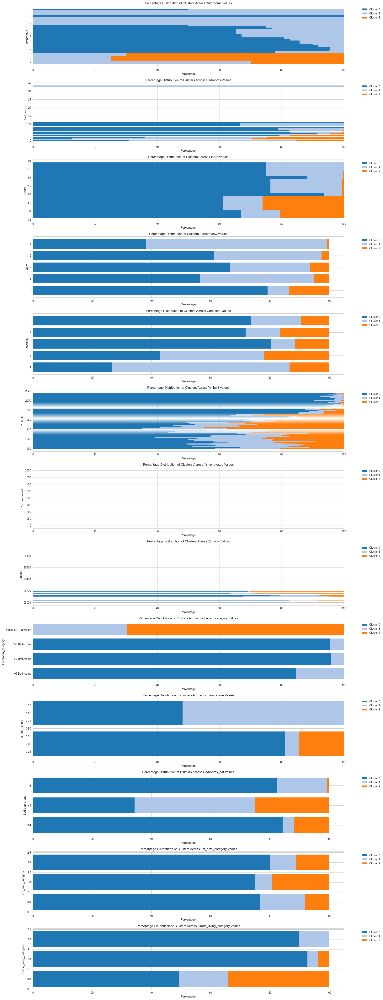

In [233]:
columns_to_plot = ['bathrooms', 'bedrooms','floors', 'view', 'condition', 'yr_built', 'yr_renovated', 'zipcode','bathroom_category','is_near_shore','bedrooms_cat','lot_size_category','grade_living_category']
# Create a figure with multiple subplots
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(20,4 * len(columns_to_plot)))

# If only one column, axes is not a list, so we make it a list for uniformity
if len(columns_to_plot) == 1:
    axes = [axes]

# Iterate over each column and plot
for ax, column in zip(axes, columns_to_plot):
    # Calculate the percentage distribution of column values within each cluster
    distribution_df = df_no_outliers.groupby(column)['cluster'].value_counts(normalize=True).unstack().fillna(0) * 100

    # Plot each cluster as a stack
    bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
    colors = sns.color_palette("tab20", len(distribution_df.columns))

    for i, cluster in enumerate(distribution_df.columns):
        ax.barh(distribution_df.index, distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
        bottom += distribution_df[cluster]

    # Customize the plot
    ax.set_title(f'Percentage Distribution of Clusters Across {column.capitalize()} Values')
    ax.set_xlabel('Percentage')
    ax.set_ylabel(column.capitalize())
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/1487987091.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff

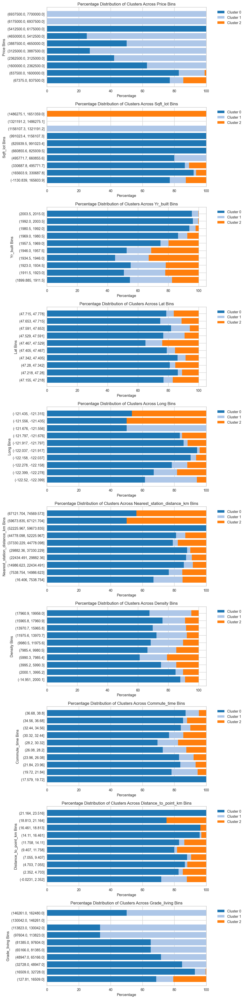

In [234]:
continuous_columns_to_plot = ['price', 'sqft_lot', 'yr_built','lat', 'long', 'nearest_station_distance_km', 'density', 'commute_time', 'distance_to_point_km','grade_living']

# Define the number of bins for continuous variables
num_bins = 10

# Bin the continuous variables and add them to the DataFrame
for column in continuous_columns_to_plot:
    df_no_outliers[f'{column}_bin'] = pd.cut(df_no_outliers[column], bins=num_bins)

# Create a figure with multiple subplots
fig, axes = plt.subplots(len(continuous_columns_to_plot), 1, figsize=(10, 4 * len(continuous_columns_to_plot)))

# If only one column, axes is not a list, so we make it a list for uniformity
if len(continuous_columns_to_plot) == 1:
    axes = [axes]

# Iterate over each column and plot
for ax, column in zip(axes, continuous_columns_to_plot):
    binned_column = f'{column}_bin'
    
    # Calculate the percentage distribution of binned column values within each cluster
    distribution_df = df_no_outliers.groupby(binned_column)['cluster'].value_counts(normalize=True).unstack().fillna(0) * 100

    # Plot each cluster as a stack
    bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
    colors = sns.color_palette("tab20", len(distribution_df.columns))

    for i, cluster in enumerate(distribution_df.columns):
        ax.barh(distribution_df.index.astype(str), distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
        bottom += distribution_df[cluster]

    # Customize the plot
    ax.set_title(f'Percentage Distribution of Clusters Across {column.capitalize()} Bins')
    ax.set_xlabel('Percentage')
    ax.set_ylabel(column.capitalize() + ' Bins')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/4252920557.py:20: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/4252920557.py:20: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/4252920557.py:20: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff

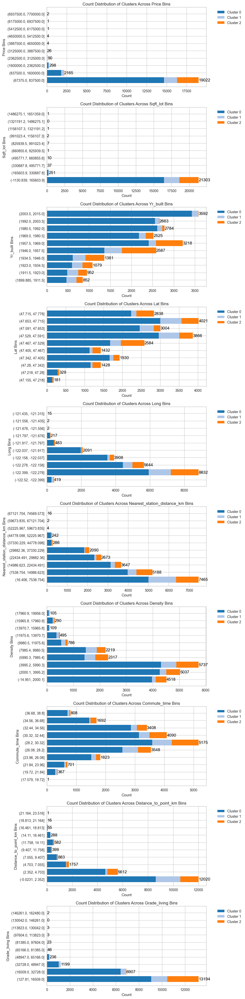

In [258]:
# Define the number of bins for continuous variables
num_bins = 10

# Bin the continuous variables and add them to the DataFrame
for column in continuous_columns_to_plot:
    df_no_outliers[f'{column}_bin'] = pd.cut(df_no_outliers[column], bins=num_bins)

# Create a figure with multiple subplots
fig, axes = plt.subplots(len(continuous_columns_to_plot), 1, figsize=(10, 4 * len(continuous_columns_to_plot)))

# If only one column, axes is not a list, so we make it a list for uniformity
if len(continuous_columns_to_plot) == 1:
    axes = [axes]

# Iterate over each column and plot
for ax, column in zip(axes, continuous_columns_to_plot):
    binned_column = f'{column}_bin'
    
    # Calculate the count distribution of binned column values within each cluster
    distribution_df = df_no_outliers.groupby(binned_column)['cluster'].value_counts().unstack().fillna(0)

    # Plot each cluster as a stack
    bottom = pd.Series([0] * len(distribution_df), index=distribution_df.index)
    colors = sns.color_palette("tab20", len(distribution_df.columns))

    for i, cluster in enumerate(distribution_df.columns):
        ax.barh(distribution_df.index.astype(str), distribution_df[cluster], left=bottom, color=colors[i], label=f'Cluster {cluster}')
        bottom += distribution_df[cluster]

    # Plot the count of each bin
    for bin_label, count in zip(distribution_df.index.astype(str), distribution_df.sum(axis=1)):
        ax.text(count, bin_label, str(count), ha='left', va='center', color='black')

    # Customize the plot
    ax.set_title(f'Count Distribution of Clusters Across {column.capitalize()} Bins')
    ax.set_xlabel('Count')
    ax.set_ylabel(column.capitalize() + ' Bins')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [259]:
# Define the number of bins for continuous variables
num_bins = 10

# Bin the continuous variables and add them to the DataFrame
for column in continuous_columns_to_plot:
    df_no_outliers[f'{column}_bin'] = pd.cut(df_no_outliers[column], bins=num_bins)

# Iterate over each column and calculate the count distribution of binned column values within each cluster
for column in continuous_columns_to_plot:
    binned_column = f'{column}_bin'
    
    # Calculate the count distribution of binned column values within each cluster
    distribution_df = df_no_outliers.groupby(binned_column)['cluster'].value_counts().unstack().fillna(0)

    # Print the count distribution table
    print(f'Count Distribution of Clusters Across {column.capitalize()} Bins:')
    print(distribution_df)
    print()

    # Calculate the percentage distribution of binned column values within each cluster
    percentage_distribution_df = (distribution_df / distribution_df.sum(axis=0)) * 100

    # Print the percentage distribution table
    print(f'Percentage Distribution of Clusters Across {column.capitalize()} Bins:')
    print(percentage_distribution_df)
    print()


Count Distribution of Clusters Across Price Bins:
cluster                     0     1     2
price_bin                                
(67375.0, 837500.0]     14676  1620  2726
(837500.0, 1600000.0]    1792   352    21
(1600000.0, 2362500.0]    187   111     0
(2362500.0, 3125000.0]     38    52     0
(3125000.0, 3887500.0]      7    19     0
(3887500.0, 4650000.0]      2     2     0
(4650000.0, 5412500.0]      1     3     0
(5412500.0, 6175000.0]      1     0     0
(6175000.0, 6937500.0]      0     1     0
(6937500.0, 7700000.0]      0     2     0

Percentage Distribution of Clusters Across Price Bins:
cluster                         0          1         2
price_bin                                             
(67375.0, 837500.0]     87.859195  74.930620  99.23553
(837500.0, 1600000.0]   10.727969  16.281221   0.76447
(1600000.0, 2362500.0]   1.119492   5.134135   0.00000
(2362500.0, 3125000.0]   0.227490   2.405180   0.00000
(3125000.0, 3887500.0]   0.041906   0.878816   0.00000
(3887

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/2333487791.py:13: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/2333487791.py:13: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/2333487791.py:13: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/m7/snhszr993kscmjx9dwlff

In [266]:
import pandas as pd
import plotly.express as px
import numpy as np

# Assuming df_no_outliers is your DataFrame and 'cluster' is the column indicating the cluster assignment

# Define bin edges in increments of 50K
bin_edges = np.arange(df_no_outliers['price'].min(), df_no_outliers['price'].max() + 50000, 50000)

# Divide the prices into bins
df_no_outliers['price_bin'] = pd.cut(df_no_outliers['price'], bins=bin_edges)

# Calculate the count distribution of price bins for each cluster
count_distribution = df_no_outliers.groupby(['price_bin', 'cluster']).size().unstack(fill_value=0)

# Convert the count distribution to a long format for Plotly
count_distribution_long = count_distribution.reset_index().melt(id_vars='price_bin', value_name='count', var_name='cluster')

# Create a numeric category for sorting
count_distribution_long['price_bin_numeric'] = count_distribution_long['price_bin'].apply(lambda x: x.left)

# Sort by the numeric category
count_distribution_long = count_distribution_long.sort_values('price_bin_numeric')

# Plot the results using Plotly
fig = px.bar(
    count_distribution_long,
    x='price_bin_numeric',
    y='count',
    color='cluster',
    title='Count Distribution of Clusters Across Price Bins',
    labels={'price_bin_numeric': 'Price Bins', 'count': 'Count'},
    barmode='stack'
)

# Customize the x-axis to display bin ranges more clearly
fig.update_layout(
    xaxis_tickangle=-45, 
    xaxis_title='Price Bins', 
    yaxis_title='Count', 
    legend_title_text='Cluster',
    xaxis=dict(
        tickmode='array',
        tickvals=count_distribution_long['price_bin_numeric'],
        ticktext=[f'{int(bin.left)}-{int(bin.right)}' for bin in count_distribution_long['price_bin'].unique()]
    )
)

# Show the plot
fig.show()


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_31256/1481465486.py:14: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



# outlier comparison

In [177]:
df.head()

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,outliers
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260,3-4,0,0,0
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990,3-4,1,2,0
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620,<3,2,0,0
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720,3-4,0,1,0
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440,3-4,1,1,0


In [178]:
# do not show all rows pd options
pd.set_option('display.max_rows', 15)

In [243]:
df_oa = df.copy()
#df_oa.drop(columns = ['bathroom_category','bedrooms_cat','lot_size_category','grade_living_category','outliers'], inplace = True)
df_oa['is_near_shore'] = df_oa['is_near_shore'].astype(int)
df_oa.head()

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,outliers
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,0,8260,3-4,0,0,0
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,0,17990,3-4,1,2,0
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,0,4620,<3,2,0,0
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,1,13720,3-4,0,1,0
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,0,13440,3-4,1,1,0


In [252]:
df_oa = df.copy()
df_oa.drop(columns = ['bathrooms','bedrooms','sqft_lot','grade_living','outliers'], inplace = True)
df_oa['is_near_shore'] = df_oa['is_near_shore'].astype(int)
df_oa.head()

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

df_oa['bathroom_category'] = label_encoder.fit_transform(df_oa['bathroom_category'])
df_oa['bedrooms_cat'] = label_encoder.fit_transform(df_oa['bedrooms_cat'])

# scele data
scaler = StandardScaler()
df_oa = scaler.fit_transform(df_oa)

from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_oa)

out = clf.predict(df_oa) 
df_no_outliers["outliers_df_cat"] = out

In [180]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_oa)

out = clf.predict(df_oa) 
df_no_outliers["outliers_df"] = out

In [253]:
column_outlier_check = 'price'

# calculate outliers based on price for IQR and Z-score and save it in a new column
Q1 = df_no_outliers[column_outlier_check].quantile(0.25)
Q3 = df_no_outliers[column_outlier_check].quantile(0.75)
IQR = Q3 - Q1
df_no_outliers['outliers_iqr'] = (df_no_outliers[column_outlier_check] < (Q1 - 1.5 * IQR)) | (df_no_outliers[column_outlier_check] > (Q3 + 1.5 * IQR))

df_no_outliers['outliers_zscore'] = (np.abs(df_no_outliers[column_outlier_check] - df_no_outliers[column_outlier_check].mean()) > (3 * df_no_outliers[column_outlier_check].std()))

# compare the number of outliers based on IQR and Z-score and outliers column
print(df_no_outliers['outliers_iqr'].value_counts())
print(df_no_outliers['outliers_zscore'].value_counts())
print(df_no_outliers['outliers'].value_counts())
print(df_no_outliers['outliers_df'].value_counts())
print(df_no_outliers['outliers_df_cat'].value_counts())

# show how many rows overlap between the three columns
print('Number of rows that are outliers in all three columns')
print(df_no_outliers[(df_no_outliers['outliers'] == True) & (df_no_outliers['outliers_iqr'] == True) & (df_no_outliers['outliers_zscore'] == True)].shape[0])
print('Number of rows that are outliers in outliers and outliers_iqr columns')
print(df_no_outliers[(df_no_outliers['outliers'] == True) & (df_no_outliers['outliers_iqr'] == True)].shape[0])
print('Number of rows that are outliers in outliers and outliers_zscore columns')
print(df_no_outliers[(df_no_outliers['outliers'] == True) & (df_no_outliers['outliers_zscore'] == True)].shape[0])
print('Number of rows that are outliers in outliers_iqr and outliers_zscore columns')
print(df_no_outliers[(df_no_outliers['outliers_iqr'] == True) & (df_no_outliers['outliers_zscore'] == True)].shape[0])
print('Number of rows that are outliers in outliers_df and outliers columns')
print(df_no_outliers[(df_no_outliers['outliers_df'] == True) & (df_no_outliers['outliers'] == True)].shape[0])
print('Number of rows that are outliers in outliers_df_cat and outliers columns')
print(df_no_outliers[(df_no_outliers['outliers_df_cat'] == True) & (df_no_outliers['outliers'] == True)].shape[0])
print('Number of rows that are outliers in outliers_df_cat and outliers columns')
print(df_no_outliers[(df_no_outliers['outliers_df_cat'] == True) & (df_no_outliers['outliers_df'] == True)].shape[0])
print('Number of rows that are outliers in outliers_df_cat and outliers outliers_df')
print(df_no_outliers[(df_no_outliers['outliers_df_cat'] == True) & (df_no_outliers['outliers_df'] == True)].shape[0])


outliers_iqr
False    20467
True      1146
Name: count, dtype: int64
outliers_zscore
False    21207
True       406
Name: count, dtype: int64
outliers
0    19451
1     2162
Name: count, dtype: int64
outliers_df
0    19451
1     2162
Name: count, dtype: int64
outliers_df_cat
0    19451
1     2162
Name: count, dtype: int64
Number of rows that are outliers in all three columns
183
Number of rows that are outliers in outliers and outliers_iqr columns
363
Number of rows that are outliers in outliers and outliers_zscore columns
183
Number of rows that are outliers in outliers_iqr and outliers_zscore columns
406
Number of rows that are outliers in outliers_df and outliers columns
783
Number of rows that are outliers in outliers_df_cat and outliers columns
790
Number of rows that are outliers in outliers_df_cat and outliers columns
1789
Number of rows that are outliers in outliers_df_cat and outliers outliers_df
1789


In [182]:
df_no_outliers[df_no_outliers['outliers_df'] == True].describe(include='all')


,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bedrooms_cat,lot_size_category,grade_living_category,outliers,cluster,outliers_iqr,outliers_zscore,outliers_df
count,2.162000e+03,2162.000000,2162.000000,2.162000e+03,2162.000000,2162.000000,2162.000000,2162.000000,2162.000000,2162.000000,2162.000000,2162.000000,2162.000000,2162.000000,2162,2162.000000,2162.000000,2162.000000,2162,2162.000000,2162,2162.000000,2162.000000,2162.000000,2162.000000,2162,2162,2162.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,2,NaN,3,NaN,NaN,NaN,NaN,2,2,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,+3 Bathrooms,NaN,NaN,NaN,False,NaN,3-4,NaN,NaN,NaN,NaN,False,False,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,703,NaN,NaN,NaN,1229,NaN,1283,NaN,NaN,NaN,NaN,1499,1817,NaN
mean,9.443273e+05,3.481036,2.548219,4.515296e+04,1.698427,0.075393,1.120722,3.410268,1965.847364,338.854302,98074.831175,47.533866,-122.181011,18701.406480,NaN,5180.751156,30.040657,4.335737,NaN,25349.542553,NaN,1.204440,1.293710,0.362165,0.466698,NaN,NaN,1.0
std,7.855964e+05,1.465589,1.173794,1.091758e+05,0.600738,0.264086,1.497104,0.755388,36.190416,749.594003,59.295140,0.160876,0.203812,16659.939651,NaN,5459.676826,4.411309,5.594626,NaN,18877.388412,NaN,0.888415,0.874994,0.480737,0.676881,NaN,NaN,0.0
min,7.500000e+04,0.000000,0.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,90.885011,NaN,5.000000,17.600000,0.000445,NaN,290.000000,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN,1.0
25%,3.755000e+05,3.000000,1.750000,5.242500e+03,1.000000,0.000000,0.000000,3.000000,1933.000000,0.000000,98022.000000,47.441800,-122.345000,4249.188442,NaN,295.000000,26.800000,0.233496,NaN,10500.000000,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN,1.0
50%,7.101000e+05,3.000000,2.500000,9.867000e+03,2.000000,0.000000,0.000000,3.000000,1972.000000,0.000000,98070.000000,47.587000,-122.238500,10874.112750,NaN,3997.000000,30.000000,0.829842,NaN,21856.000000,NaN,2.000000,2.000000,0.000000,0.000000,NaN,NaN,1.0
75%,1.300000e+06,4.000000,3.500000,2.602875e+04,2.000000,0.000000,2.000000,4.000000,2001.000000,0.000000,98115.000000,47.647175,-122.005250,32659.194124,NaN,8197.000000,34.200000,8.660279,NaN,35085.000000,NaN,2.000000,2.000000,1.000000,1.000000,NaN,NaN,1.0


In [249]:
df_no_outliers['outliers_df'].value_counts()

outliers_df
0    19451
1     2162
Name: count, dtype: int64

In [289]:
# List of column names used in compile_text
columns = [
    'bedrooms_cat', 
    'lot_size_category', 
    'floors', 
    'view', 
    'condition', 
    'bathroom_category', 
    'is_near_shore', 
    'grade_living_category'
]

# distribution of outliers_df acroos clusters
df_no_outliers.groupby('cluster')['grade_living_category'].value_counts().unstack()


grade_living_category,0,1,2
cluster,,,
0,3556,6705,6443
1,1189,254,719
2,2465,275,7


In [256]:
# distribution of outliers_df acroos clusters
df_no_outliers.groupby('outliers')['cluster'].value_counts(normalize=True).unstack().fillna(0) * 100


cluster,0,1,2
outliers,,,
0,85.877333,0.0,14.122667
1,0.000000,100.0,0.000000


In [238]:
# std of pirce in cluster 1
print(df_no_outliers[df_no_outliers['cluster'] == 1]['price'].std().astype(int))

679175


In [290]:
df_no_outliers['cluster'].value_counts()    

cluster
0    16704
2     2747
1     2162
Name: count, dtype: int64

## Apply HDBSCAN

Silhouette Score: 0.3804627473068714
Davies-Bouldin Index: 0.7435723043367256
Number of clusters: 216
Noise proportion: 0.49


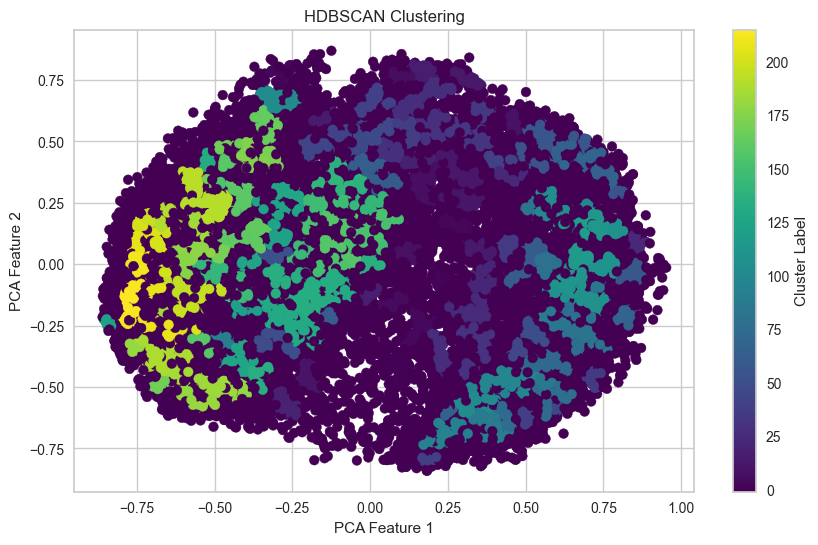

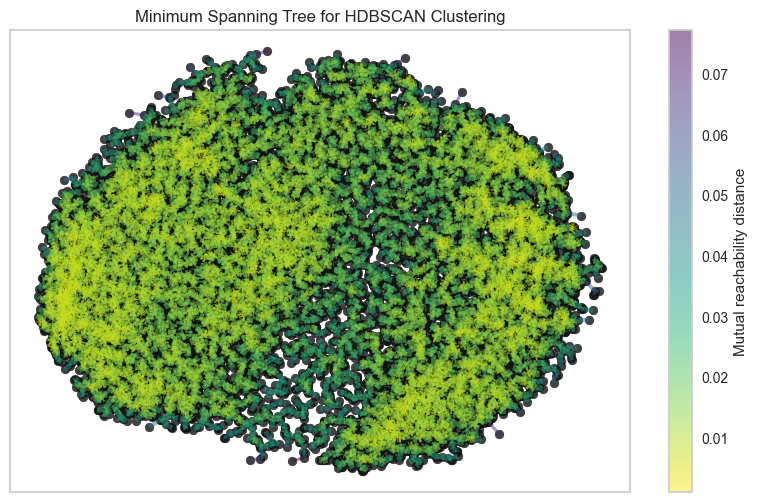

In [292]:
import hdbscan
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Example for scaling and PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_oa)

# Optionally normalize the data
X_normalized = normalize(X_scaled)

# Optionally apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_normalized)

# Adjust HDBSCAN parameters
clusterer = hdbscan.HDBSCAN(min_cluster_size=20, min_samples=5, gen_min_span_tree=True)
clusterer.fit(X_pca)
df_no_outliers['cluster_hdbscan'] = clusterer.labels_

# Evaluate clustering performance
non_noise_points = df_no_outliers['cluster_hdbscan'] != -1
X_filtered = X_pca[non_noise_points]
labels_filtered = df_no_outliers['cluster_hdbscan'][non_noise_points]

if len(set(labels_filtered)) > 1:
    silhouette_avg = silhouette_score(X_filtered, labels_filtered)
    db_index = davies_bouldin_score(X_filtered, labels_filtered)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')
else:
    print("Silhouette Score and Davies-Bouldin Index not applicable (only one cluster)")

num_clusters = len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0)
noise_proportion = np.sum(clusterer.labels_ == -1) / len(clusterer.labels_)
print(f'Number of clusters: {num_clusters}')
print(f'Noise proportion: {noise_proportion:.2f}')

# Visualize the clustering
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusterer.labels_, cmap='viridis', marker='o')
plt.title('HDBSCAN Clustering')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.colorbar(label='Cluster Label')
plt.show()

# Optionally, plot the minimum spanning tree
plt.figure(figsize=(10, 6))
clusterer.minimum_spanning_tree_.plot()
plt.title('Minimum Spanning Tree for HDBSCAN Clustering')
plt.show()


In [294]:
# pca for df_encoding_with_out
pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_embedding_with_out)

# pca variance ratio
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.sum())


[0.80954333 0.084093   0.03370061]
0.9273369433562071


In [296]:
# Spectral Clustering
from sklearn.cluster import SpectralClustering

# Define the number of clusters
n_clusters = 3

# Apply Spectral Clustering
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', n_jobs=-1)
clusters_predict = spectral.fit_predict(df_embedding_with_out)

# Evaluate clustering performance
if len(set(clusters_predict)) > 1:
    silhouette_avg = silhouette_score(df_embedding_with_out, clusters_predict)
    db_index = davies_bouldin_score(df_embedding_with_out, clusters_predict)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')

# Visualize the clustering
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_with_out, clusters_predict)

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Silhouette Score: -0.3093798679413379
Davies-Bouldin Index: 2.7667252526925323


In [298]:
# Gaussian Mixture Models (GMM) with Robust Initialization
from sklearn.mixture import GaussianMixture

# Define the number of clusters
n_clusters = 3

# Apply Gaussian Mixture Models
gmm = GaussianMixture(n_components=n_clusters, n_init=10)
clusters_predict = gmm.fit_predict(df_embedding_with_out)

# Evaluate clustering performance
if len(set(clusters_predict)) > 1:
    silhouette_avg = silhouette_score(df_embedding_with_out, clusters_predict)
    db_index = davies_bouldin_score(df_embedding_with_out, clusters_predict)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')

# Visualize the clustering
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_with_out, clusters_predict)

Silhouette Score: 0.5347658966931773
Davies-Bouldin Index: 0.6037804697771699


In [302]:
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt

# Assuming df_embedding_with_out is your input dataframe with high-dimensional features

# Standardize the data
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(df_embedding_with_out)
X_scaled = df_embedding_with_out.copy()

# Apply PCA for dimensionality reduction
n_components = 3  # Adjust this number based on your data
pca = PCA(n_components=n_components)
#X_pca = pca.fit_transform(X_scaled)
X_pca = X_scaled.copy()

# Define the number of clusters
n_clusters = 3

# Apply Gaussian Mixture Models with robust initialization
gmm = GaussianMixture(n_components=n_clusters, n_init=10, covariance_type='full', random_state=42)
clusters_predict = gmm.fit_predict(X_pca)

# Evaluate clustering performance
if len(set(clusters_predict)) > 1:
    silhouette_avg = silhouette_score(X_pca, clusters_predict)
    db_index = davies_bouldin_score(X_pca, clusters_predict)
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Davies-Bouldin Index: {db_index}')

# Visualize the clustering in 2D PCA space
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters_predict, cmap='viridis', marker='o')
plt.title('GMM Clustering (PCA-reduced Data)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

# Function for 3D PCA Visualization
def get_pca_3d(data, labels):
    pca_3d = PCA(n_components=3)
    data_pca_3d = pca_3d.fit_transform(data)
    df_pca_3d = pd.DataFrame(data_pca_3d, columns=['PCA1', 'PCA2', 'PCA3'])
    df_pca_3d['Cluster'] = labels
    return pca_3d, df_pca_3d

# 3D PCA Visualization
pca_3d_object, df_pca_3d = get_pca_3d(X_scaled, clusters_predict)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca_3d['PCA1'], df_pca_3d['PCA2'], df_pca_3d['PCA3'], c=df_pca_3d['Cluster'], cmap='viridis')

legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)
plt.title('GMM Clustering (3D PCA Visualization)')
plt.show()


Silhouette Score: 0.5347658966931773
Davies-Bouldin Index: 0.6037804697771699


InvalidIndexError: (slice(None, None, None), 0)

<Figure size 1000x600 with 0 Axes>